In [1]:
import numpy as np
import tensorflow as tf
from PIL import Image
from skimage import color
import os

2022-12-05 16:42:57.011040: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
tf.__version__

'2.11.0'

In [12]:
# %cd ..
# os.getcwd()

/Users/karankashyap/Documents/Brown University/cs1470/Term Project/red-greeNN-blue


'/Users/karankashyap/Documents/Brown University/cs1470/Term Project/red-greeNN-blue'

In [2]:
X_loaded = np.load("preprocessed_data/intel-dataset/inputs.npy")
y_loaded = np.load("preprocessed_data/intel-dataset/labels.npy")

In [3]:
print(X_loaded.shape)
print(y_loaded.shape)

(24267, 150, 150)
(24267, 150, 150, 3)


In [4]:
X_subset = X_loaded[:1000,:,:]
y_subset = y_loaded[:1000,:,:,1:]

In [5]:
X_subset = tf.expand_dims(X_subset, 3)

2022-12-05 16:43:23.810617: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [6]:
print(X_subset.shape)
print(y_subset.shape)

(1000, 150, 150, 1)
(1000, 150, 150, 2)


In [7]:
def defined_loss(truth, pred):
  print("loss start")
  # pred = tf.reshape(pred, (-1, 150, 150, 2))
  loss = tf.reduce_mean(tf.math.square(truth - pred))
  print("Return loss")
  return loss

In [8]:
model = tf.keras.Sequential([
    tf.keras.Input(shape=(150,150,1)),
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, strides=1, padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),

    tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=4, strides=1, padding="same"), # Changed strides to 1
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, strides=1, padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),

    # In the Pytorch code associated with the paper, they make two separate models: one for
    # classification and one for regression... we might need to implement the second one too
    # (only done the classification one for now)
    # tf.keras.layers.Conv2D(filters=529, kernel_size=1, strides=1, padding="valid"),
    tf.keras.layers.Conv2D(filters=2, kernel_size=1, strides=1, padding="valid"),
])

In [9]:
model.compile(optimizer=tf.keras.optimizers.Adam(), loss=defined_loss)
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 150, 150, 64)      640       
_________________________________________________________________
batch_normalization (BatchNo (None, 150, 150, 64)      256       
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 150, 150, 64)      65600     
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 150, 150, 64)      36928     
_________________________________________________________________
batch_normalization_1 (Batch (None, 150, 150, 64)      256       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 150, 150, 2)       130       
Total params: 103,810
Trainable params: 103,554
Non-trainable params: 256
________________________________________________

In [13]:
model.fit(X_subset, y_subset, verbose=1, batch_size=100, epochs=4)

2022-11-29 00:57:42.219649: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/4
loss start
Return loss
loss start
Return loss
10/10 [==============================] - 231s 23s/step - loss: 177.7551
Epoch 2/4
10/10 [==============================] - 191s 19s/step - loss: 166.4084
Epoch 3/4
10/10 [==============================] - 266s 26s/step - loss: 161.4615
Epoch 4/4
10/10 [==============================] - 252s 26s/step - loss: 160.2781


In [14]:
model.save("small_model")

2022-11-29 01:14:50.496974: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: small_model/assets


In [7]:
X_test = X_loaded[2000:2050,:,:]
y_test = y_loaded[2000:2050,:,:,:]

In [8]:
X_test = tf.expand_dims(X_test, 3)

In [9]:
print("X_test shape", X_test.shape)
print("y_test shape", y_test.shape)

X_test shape (50, 150, 150, 1)
y_test shape (50, 150, 150, 3)


In [11]:
def display_img(img):
    final_output_img_rgb = (color.lab2rgb(img) * 255).astype(np.uint8)
    pli_img = Image.fromarray(final_output_img_rgb)
    display(pli_img.convert('RGB') if pli_img.mode != 'RGB' else pli_img)

In [55]:
sample = y_test[0,:,:,:]
sample.shape

(150, 150, 3)

In [52]:
sample_img = Image.fromarray((color.lab2rgb(sample) * 255).astype(np.uint8))

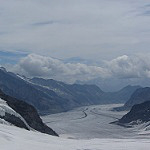

In [53]:
display(sample_img)

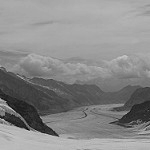

In [54]:
display(sample_img.convert('L'))

original:


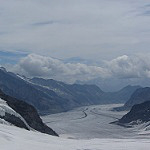

black and white:


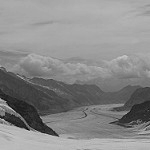

model output:


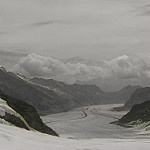

original:


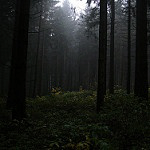

black and white:


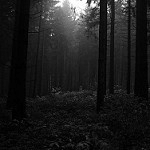

model output:


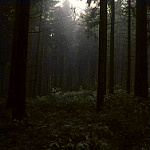

original:


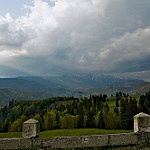

black and white:


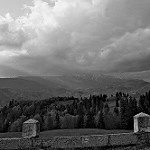

model output:


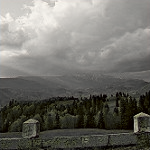

original:


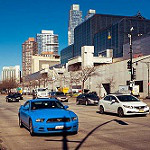

black and white:


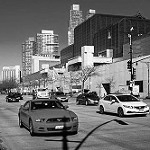

model output:


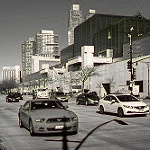

original:


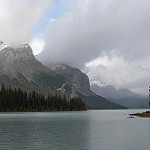

black and white:


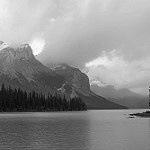

model output:


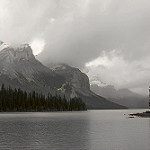

original:


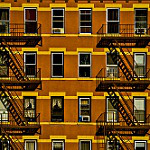

black and white:


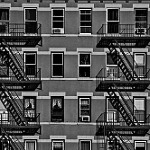

model output:


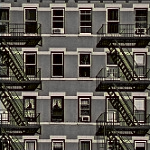

original:


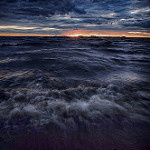

black and white:


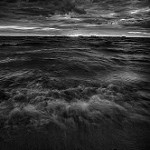

model output:


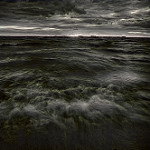

original:


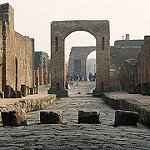

black and white:


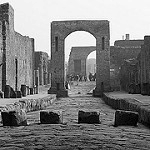

model output:


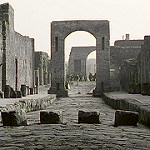

original:


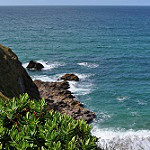

black and white:


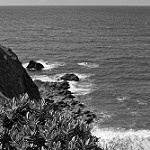

model output:


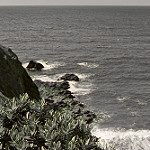

original:


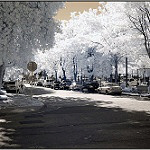

black and white:


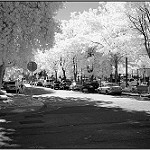

model output:


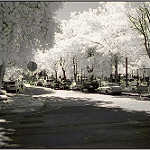

original:


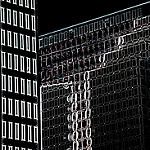

black and white:


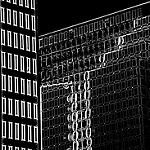

model output:


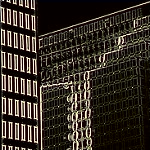

original:


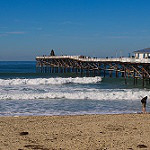

black and white:


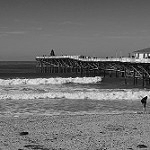

model output:


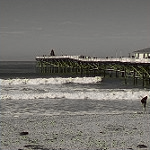

original:


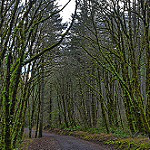

black and white:


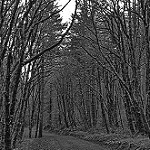

model output:


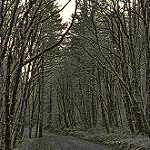

original:


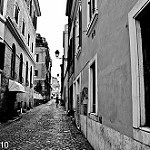

black and white:


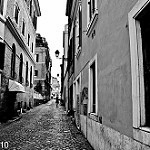

model output:


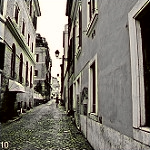

original:


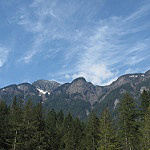

black and white:


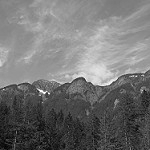

model output:


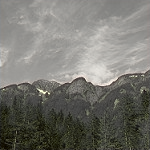

original:


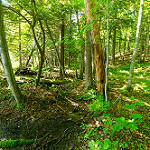

black and white:


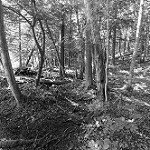

model output:


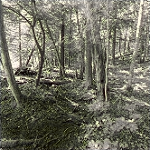

original:


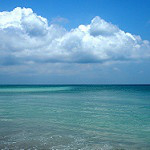

black and white:


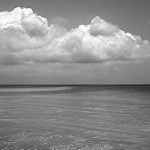

model output:


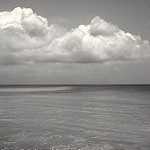

original:


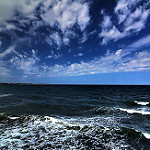

black and white:


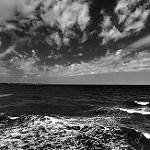

model output:


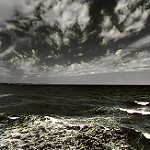

original:


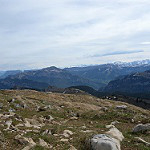

black and white:


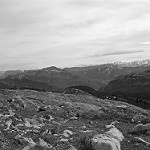

model output:


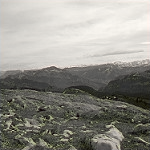

original:


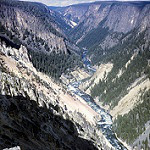

black and white:


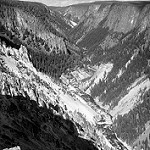

model output:


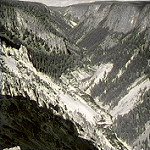

original:


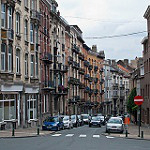

black and white:


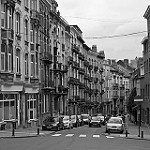

model output:


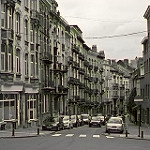

original:


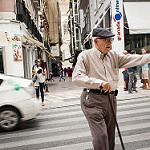

black and white:


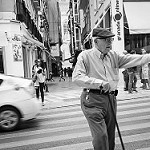

model output:


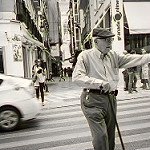

original:


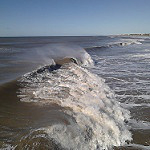

black and white:


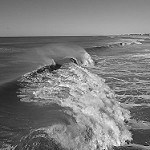

model output:


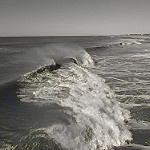

original:


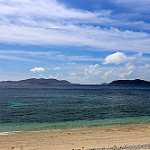

black and white:


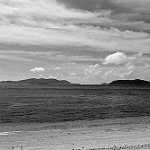

model output:


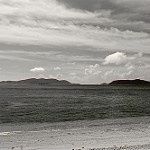

original:


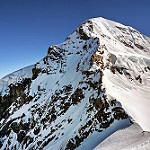

black and white:


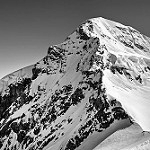

model output:


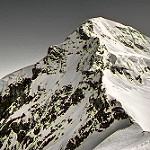

original:


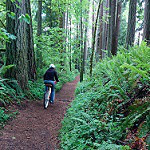

black and white:


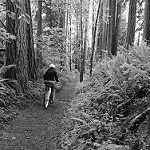

model output:


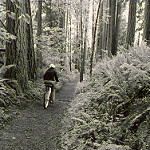

original:


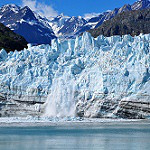

black and white:


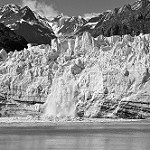

model output:


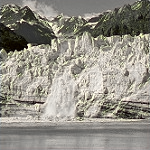

original:


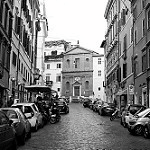

black and white:


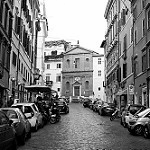

model output:


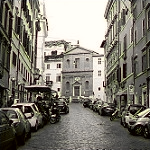

original:


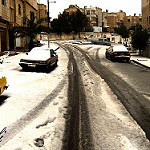

black and white:


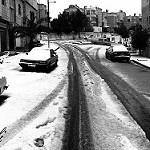

model output:


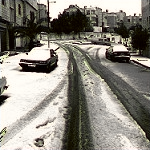

original:


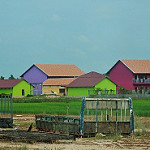

black and white:


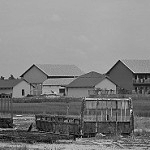

model output:


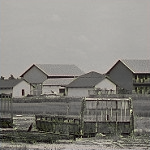

original:


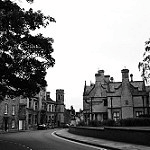

black and white:


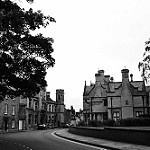

model output:


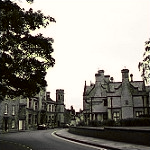

original:


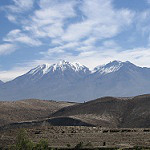

black and white:


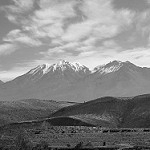

model output:


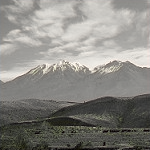

original:


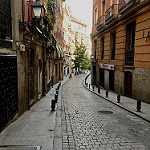

black and white:


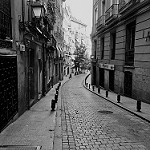

model output:


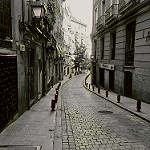

original:


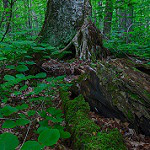

black and white:


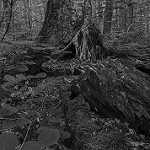

model output:


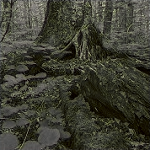

original:


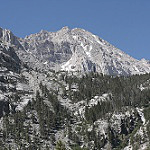

black and white:


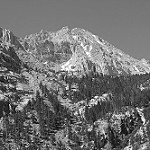

model output:


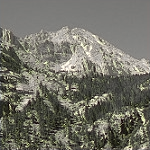

original:


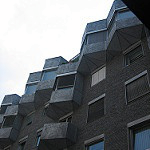

black and white:


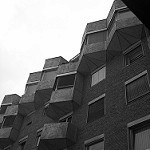

model output:


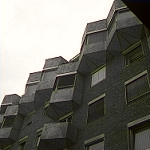

original:


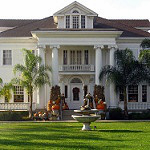

black and white:


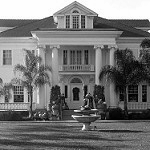

model output:


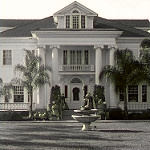

original:


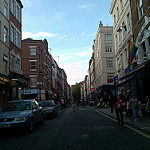

black and white:


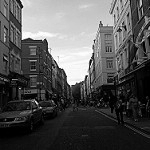

model output:


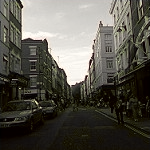

original:


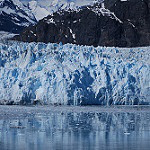

black and white:


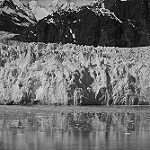

model output:


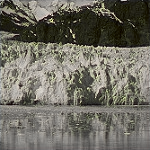

original:


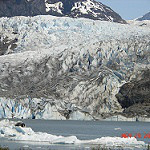

black and white:


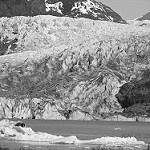

model output:


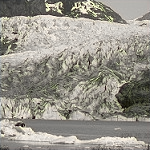

original:


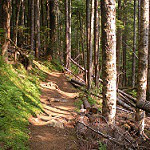

black and white:


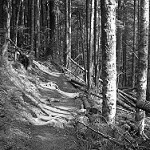

model output:


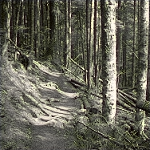

original:


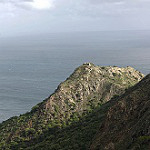

black and white:


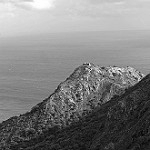

model output:


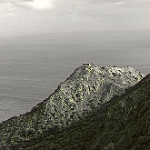

original:


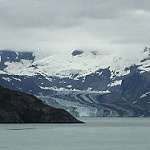

black and white:


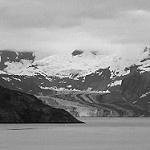

model output:


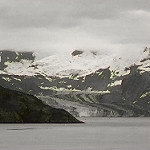

original:


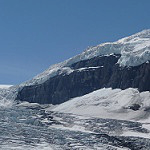

black and white:


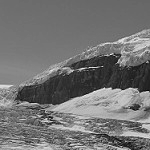

model output:


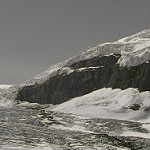

original:


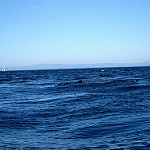

black and white:


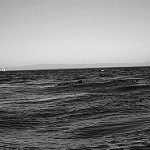

model output:


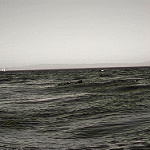

original:


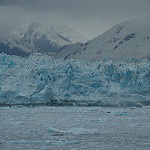

black and white:


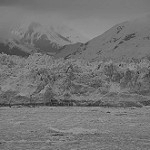

model output:


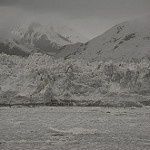

original:


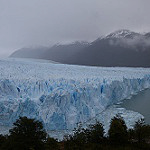

black and white:


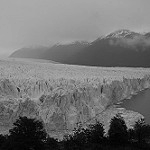

model output:


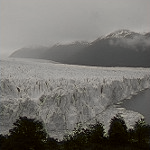

original:


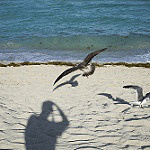

black and white:


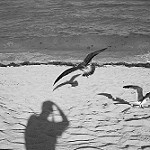

model output:


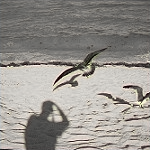

original:


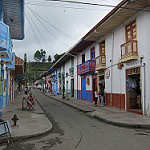

black and white:


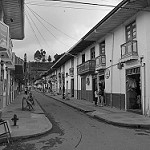

model output:


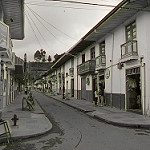

original:


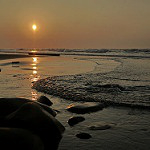

black and white:


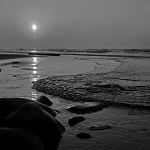

model output:


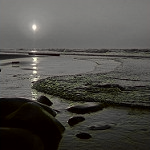

In [56]:
for i in range(X_test.shape[0]):
    output_img = model(tf.expand_dims(X_test[i,:,:], 0))
    print("original:")
    display_img(tf.squeeze(y_test[i,:,:,:]))
    print("black and white:")
    bw_img = Image.fromarray((color.lab2rgb(y_test[i,:,:,:]) * 255).astype(np.uint8))
    display(bw_img.convert('L'))
    print("model output:")
    pred_img = tf.concat([tf.expand_dims(X_test[i,:,:], 0), output_img], 3)
    display_img(tf.squeeze(pred_img))

## Try with complex loss function

In [11]:
%cd colorizer/loss

/Users/karankashyap/Documents/Brown University/cs1470/Term Project/red-greeNN-blue/colorizer/loss


In [12]:
os.getcwd()

'/Users/karankashyap/Documents/Brown University/cs1470/Term Project/red-greeNN-blue/colorizer/loss'

In [13]:
from loss import MultinomialCrossEntropyLoss

In [22]:
model2 = tf.keras.Sequential([
    tf.keras.Input(shape=(150,150,1)),
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, strides=1, padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),

    tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=4, strides=1, padding="same"), # Changed strides to 1
    tf.keras.layers.Conv2D(filters=64, kernel_size=3, strides=1, padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),

    # In the Pytorch code associated with the paper, they make two separate models: one for
    # classification and one for regression... we might need to implement the second one too
    # (only done the classification one for now)
    tf.keras.layers.Conv2D(filters=529, kernel_size=1, strides=1, padding="valid", activation="softmax"),
    # tf.keras.layers.Conv2D(filters=2, kernel_size=1, strides=1, padding="valid"),
])

In [23]:
import tensorflow as tf
dummy = tf.zeros(shape=(2, 150, 150, 2))

In [26]:
X_mini = X_subset[:1]
y_mini = y_subset[:1]
print(X_mini.shape)
print(y_mini.shape)

(1, 150, 150, 1)
(1, 150, 150, 2)


In [27]:
loss_class = MultinomialCrossEntropyLoss(y_mini)

self.a_minimum: -110
Start
Done loading file
begin get batch bin distribution
image shape:  (150, 150, 2)
begin image bin distribution
image shape: (150, 150, 2)
flattened image shape: (22500, 2)
pixel[0] tf.Tensor(24.76969, shape=(), dtype=float32)
Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089
image_bin_distribution shape: (22500, 529)
finish batch bin distribution
batch bin distribution shape: (1, 150, 150, 529)
begin self.w initialization
w shape: (529,)
self.p shape: (529,)


In [28]:
model2.compile(optimizer=tf.keras.optimizers.Adam(), loss=loss_class.loss, run_eagerly=True)
model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 64)      640       
                                                                 
 batch_normalization (BatchN  (None, 150, 150, 64)     256       
 ormalization)                                                   
                                                                 
 conv2d_transpose (Conv2DTra  (None, 150, 150, 64)     65600     
 nspose)                                                         
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 64)      36928     
                                                                 
 batch_normalization_1 (Batc  (None, 150, 150, 64)     256       
 hNormalization)                                                 
                                                        

In [29]:
model2.fit(X_mini, y_mini, verbose=1, batch_size=2, epochs=1)

y_preds shape: (1, 150, 150, 529)
begin get batch bin distribution
image shape:  (150, 150, 2)
begin image bin distribution
image shape: (150, 150, 2)
flattened image shape: (22500, 2)
pixel[0] tf.Tensor(24.76969, shape=(), dtype=float32)
image_bin_distribution shape: (22500, 529)
finish batch bin distribution
batch bin distribution shape: (1, 150, 150, 529)
Z shape: (1, 150, 150, 529)
v_image image shape: (150, 150, 529)
result shape: (22500,)
reshaped result shape: (150, 150)
v shape: (1, 150, 150)
crossentropy_loss shape: (1, 150, 150)
1/1 [==============================] - 240s 240s/step - loss: -26523.3789


In [22]:
model2.save("model_with_complex_loss")

INFO:tensorflow:Assets written to: model_with_complex_loss/assets


INFO:tensorflow:Assets written to: model_with_complex_loss/assets


In [17]:
mdl = tf.keras.models.load_model('model_with_complex_loss')

ValueError: Unknown loss function: 'loss'. Please ensure you are using a `keras.utils.custom_object_scope` and that this object is included in the scope. See https://www.tensorflow.org/guide/keras/save_and_serialize#registering_the_custom_object for details.

In [2]:
import numpy as np
import tensorflow as tf

2022-12-05 16:39:29.654510: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [30]:
vals = np.load('bin_to_ab_array.npy')

In [31]:
vals.shape

(529, 2)

In [15]:
output = tf.ones(shape=(22500, 529))

In [32]:
model2(tf.ones(shape=(150,150,1))).shape

TensorShape([150, 150, 1, 529])

In [33]:
def h(predicted_img, values, T=0.38):
    probabilities = tf.nn.softmax(predicted_img / T)
    expected_value = tf.matmul(probabilities, values)
    return expected_value

In [21]:
h(output, vals)

NameError: name 'output' is not defined

In [34]:
def display_img(img):
    final_output_img_rgb = (color.lab2rgb(img) * 255).astype(np.uint8)
    pli_img = Image.fromarray(final_output_img_rgb)
    display(pli_img.convert('RGB') if pli_img.mode != 'RGB' else pli_img)

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


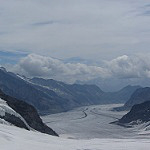

black and white:


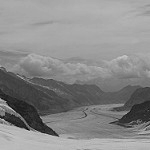

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


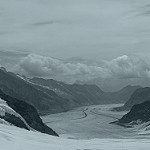

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


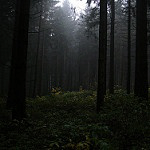

black and white:


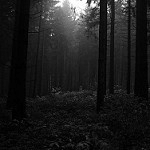

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


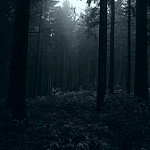

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


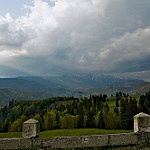

black and white:


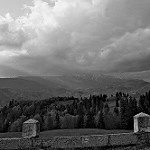

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


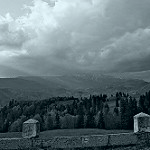

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


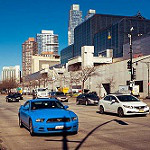

black and white:


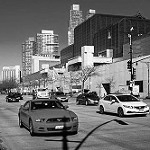

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


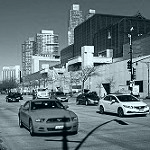

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


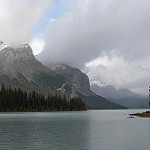

black and white:


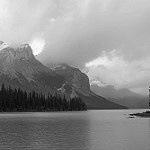

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


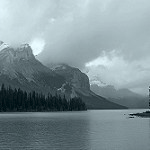

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


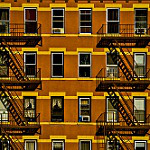

black and white:


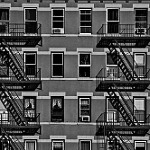

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


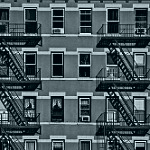

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


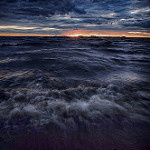

black and white:


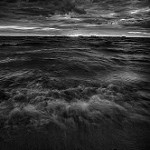

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


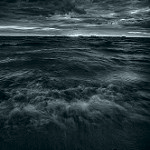

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


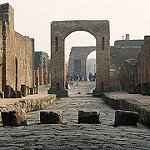

black and white:


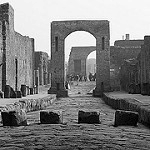

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


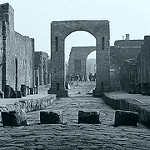

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


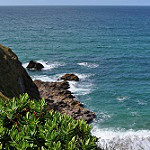

black and white:


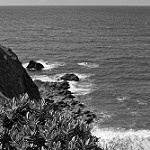

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


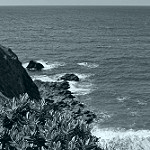

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


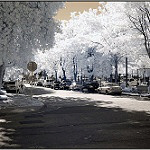

black and white:


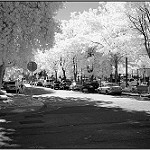

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


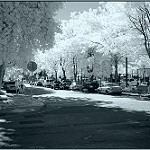

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


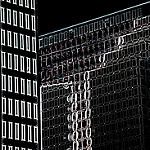

black and white:


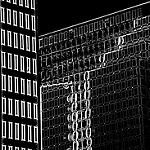

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


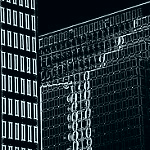

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


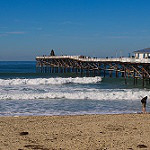

black and white:


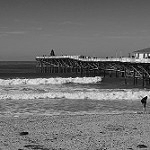

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


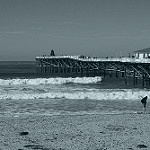

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


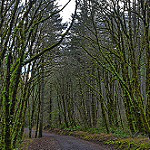

black and white:


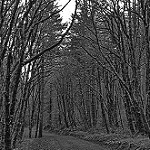

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


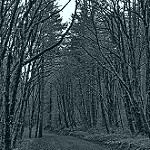

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


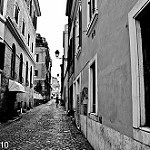

black and white:


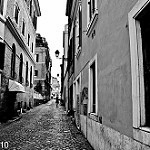

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


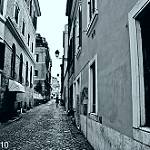

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


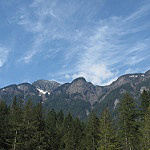

black and white:


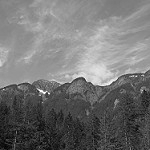

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


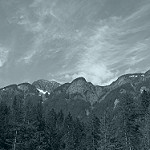

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


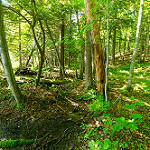

black and white:


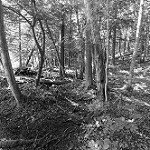

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


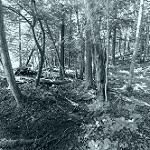

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


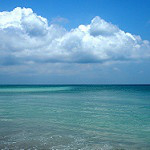

black and white:


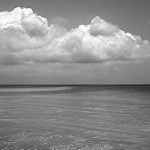

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


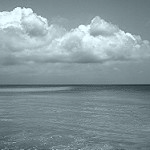

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


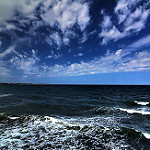

black and white:


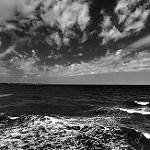

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


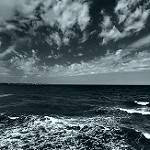

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


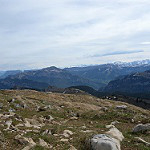

black and white:


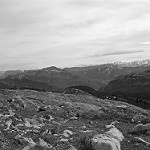

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


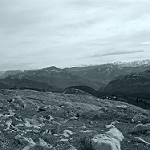

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


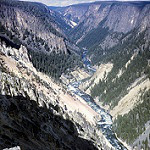

black and white:


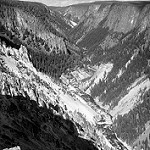

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


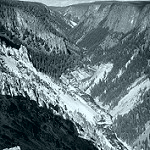

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


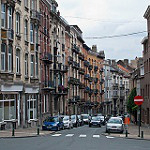

black and white:


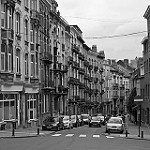

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


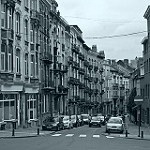

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


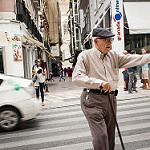

black and white:


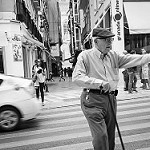

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


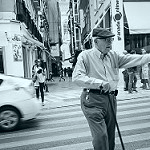

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


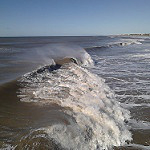

black and white:


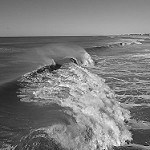

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


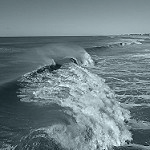

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


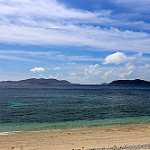

black and white:


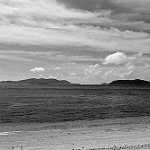

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


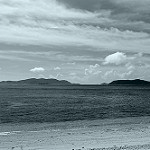

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


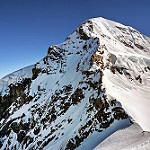

black and white:


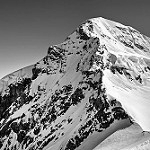

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


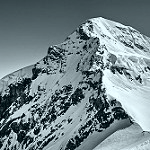

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


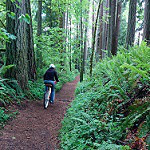

black and white:


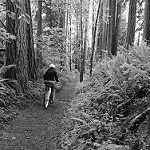

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


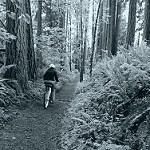

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


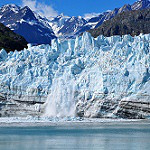

black and white:


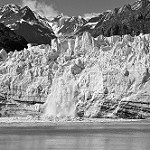

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


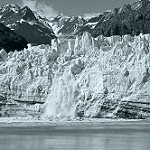

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


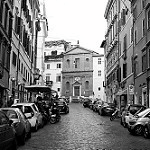

black and white:


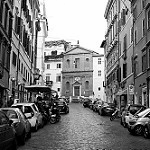

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


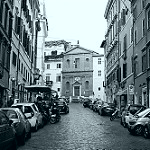

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


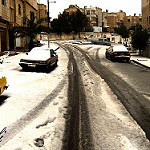

black and white:


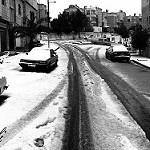

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


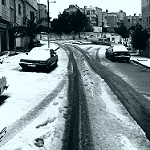

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


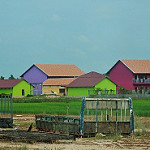

black and white:


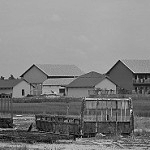

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


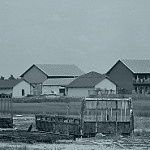

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


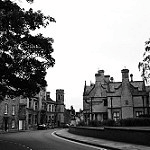

black and white:


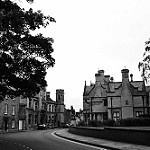

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


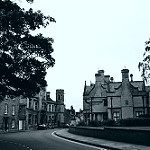

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


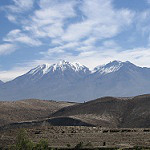

black and white:


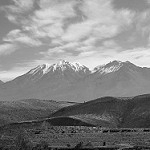

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


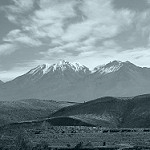

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


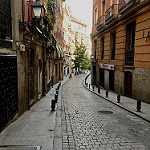

black and white:


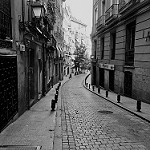

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


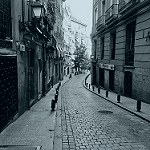

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


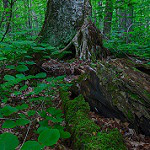

black and white:


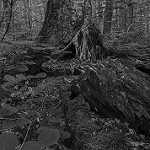

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


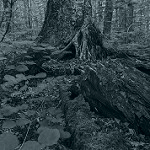

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


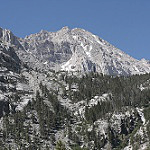

black and white:


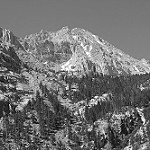

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


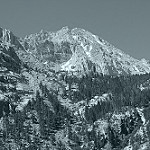

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


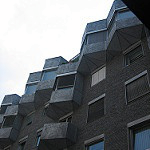

black and white:


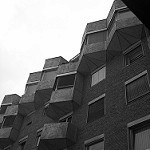

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


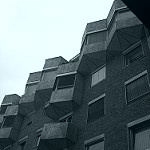

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


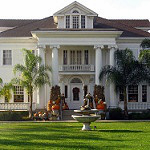

black and white:


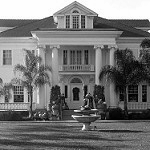

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


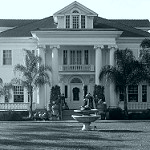

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


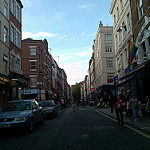

black and white:


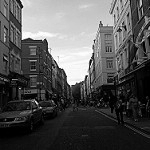

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


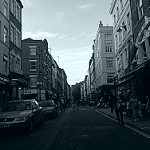

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


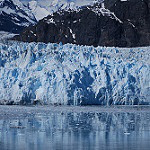

black and white:


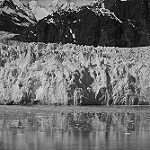

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


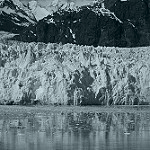

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


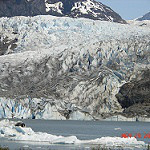

black and white:


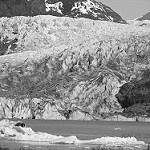

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


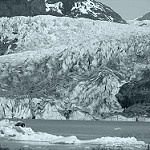

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


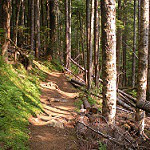

black and white:


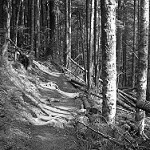

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


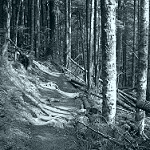

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


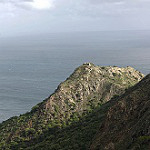

black and white:


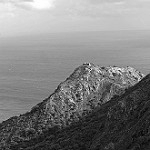

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


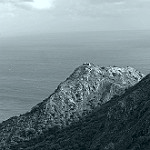

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


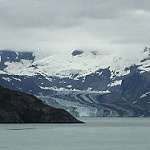

black and white:


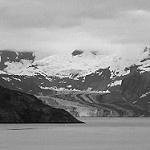

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


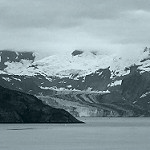

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


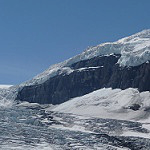

black and white:


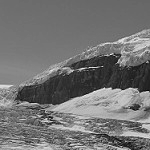

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


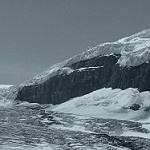

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


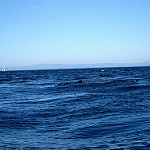

black and white:


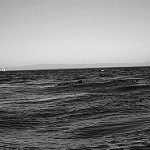

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


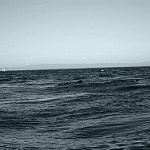

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


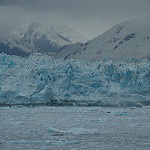

black and white:


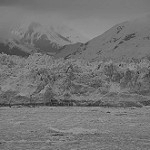

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


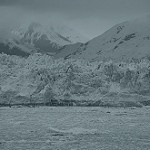

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


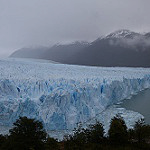

black and white:


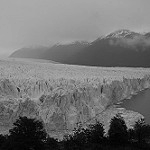

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


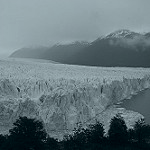

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


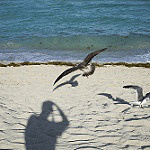

black and white:


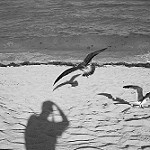

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


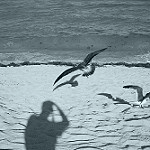

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


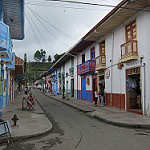

black and white:


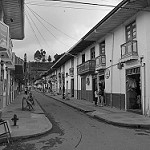

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


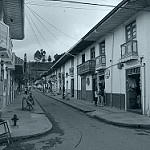

(1, 150, 150, 529)
squeezed image:  (150, 150, 529)
reshaped shape: (22500, 529)
original:


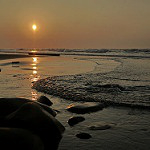

black and white:


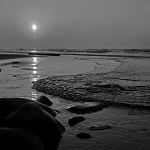

model output:
initial h_result shape: (22500, 2)
h_result shape: (1, 150, 150, 2)


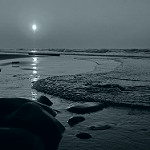

In [35]:
for i in range(X_test.shape[0]):
    output_img = model2(tf.expand_dims(X_test[i,:,:], 0))
    # output_img = tf.ones(shape=(150,150,1,529))
    print(output_img.shape)
    output_img = tf.squeeze(output_img)
    print("squeezed image: ", output_img.shape)
    output_img = tf.reshape(output_img, shape=(150 * 150, 529))
    print("reshaped shape:", output_img.shape)
    print("original:")
    display_img(tf.squeeze(y_test[i,:,:,:]))
    print("black and white:")
    bw_img = Image.fromarray((color.lab2rgb(y_test[i,:,:,:]) * 255).astype(np.uint8))
    display(bw_img.convert('L'))
    print("model output:")
    h_result = h(output_img, vals)
    print("initial h_result shape:", h_result.shape)
    h_result = tf.expand_dims(tf.reshape(h_result, shape=(150, 150, 2)), axis=0)
    print("h_result shape:", h_result.shape)
    pred_img = tf.concat([tf.expand_dims(X_test[i,:,:], 0), h_result], 3)
    display_img(tf.squeeze(pred_img))